/tmp/ipykernel_1448266/1445665839.py:36: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(12, 5))


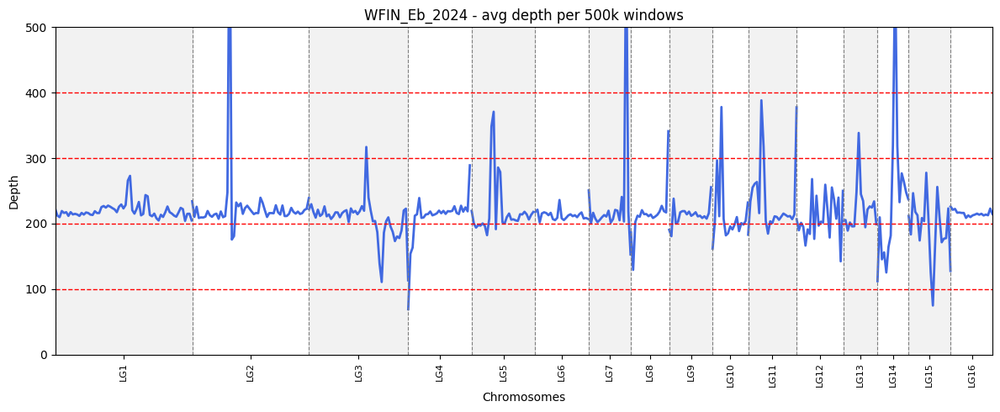

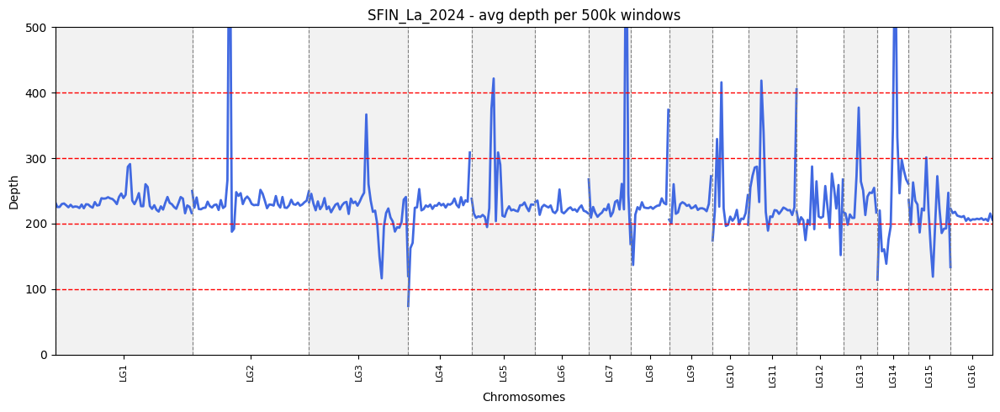

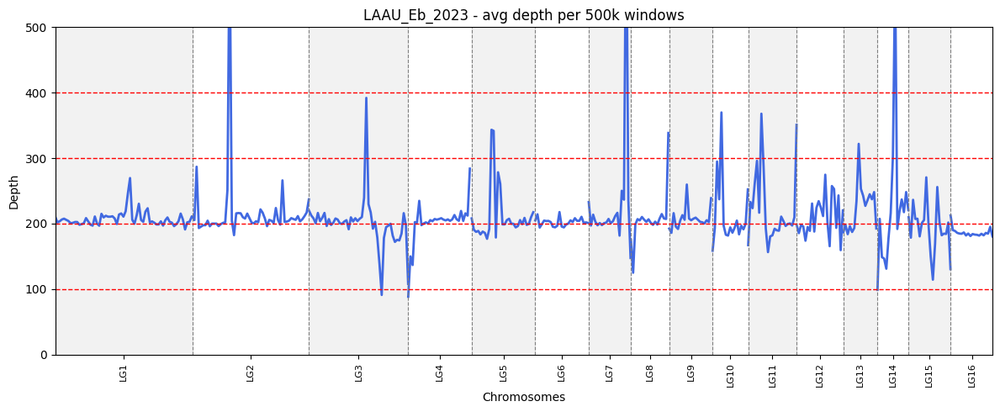

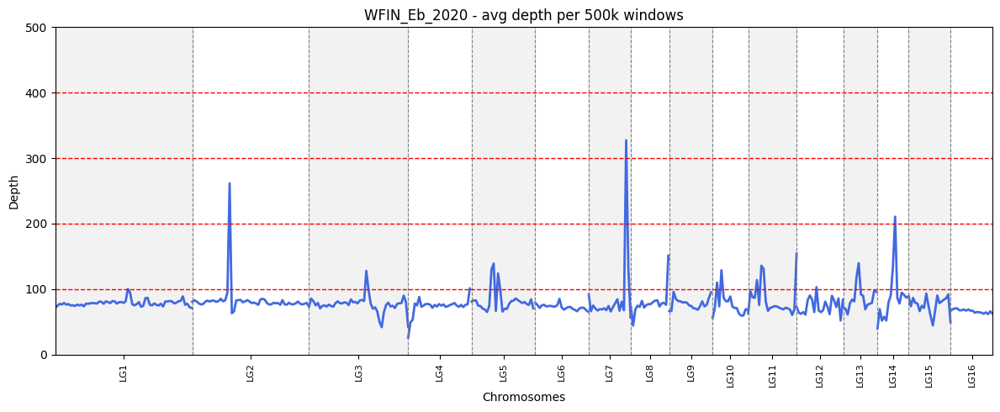

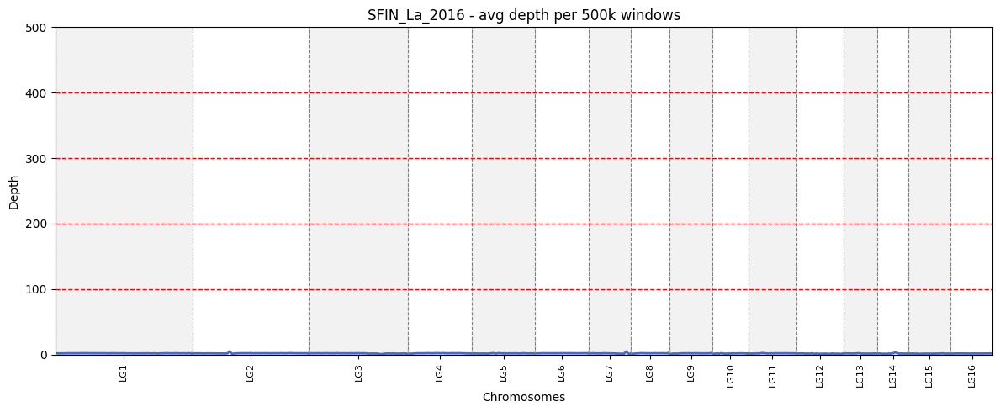

...

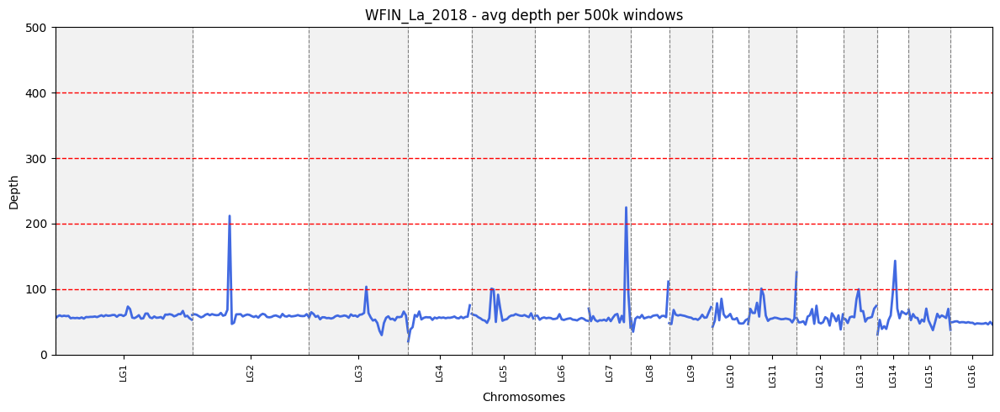

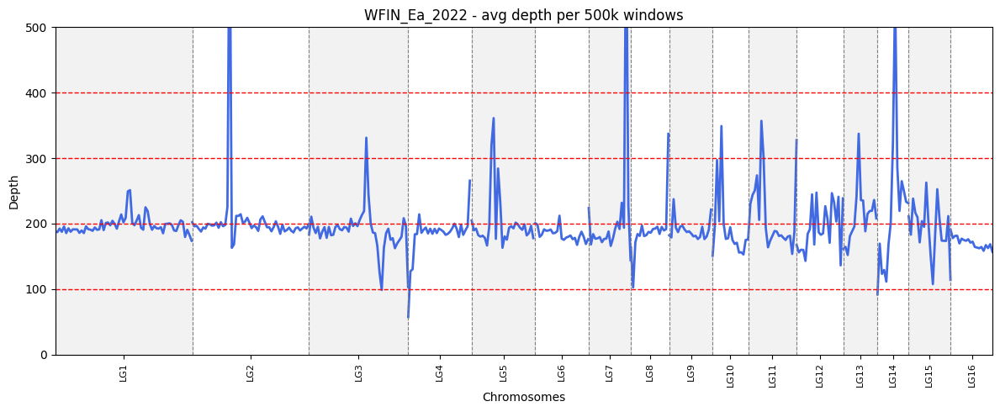

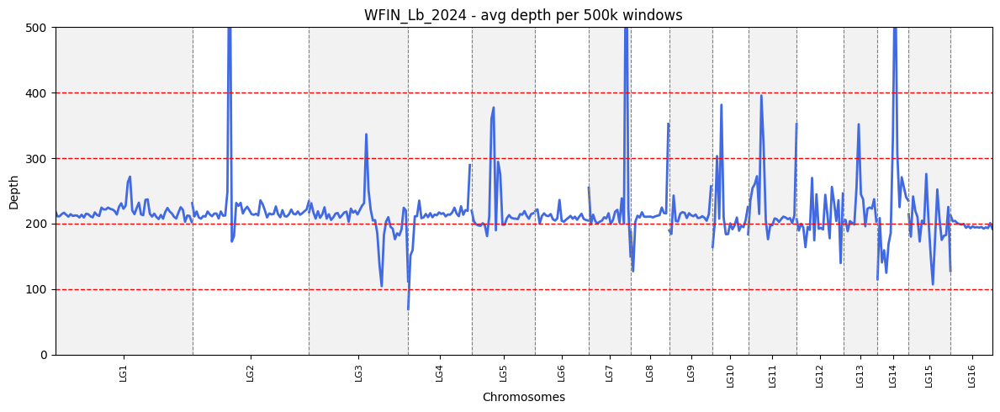

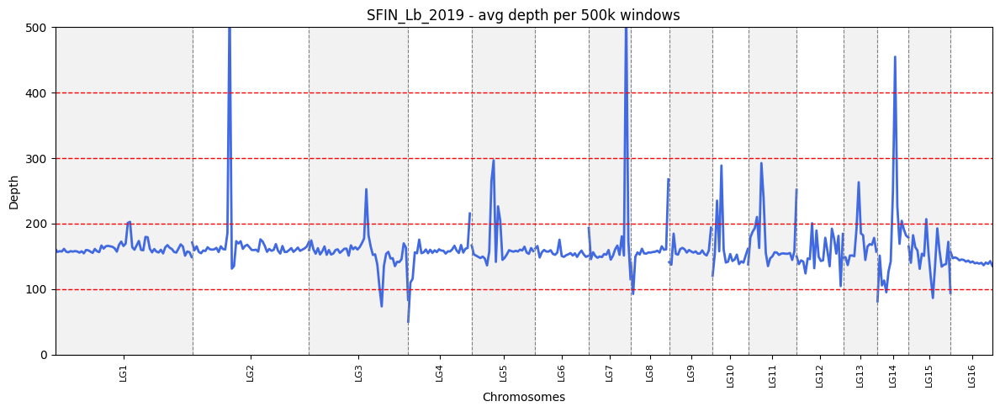

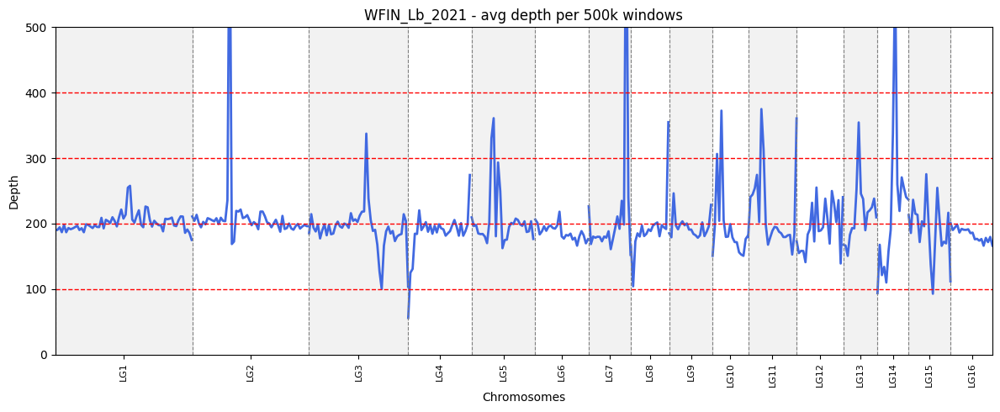

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Set working directory and load data
wd = "../../results/03_dedup/"

def plot(filepath, outplot):
    df = pd.read_csv(filepath, sep='\t', header=None,
                    names=["chrom", "start", "end", "depth"])

    # Sort by contig and start
    df = df[df["chrom"].str.startswith("LG")]

    # Sort by contig and start
    df.sort_values(by=["chrom", "start"], inplace=True)

    # Compute contig lengths
    contig_lengths = df.groupby("chrom")["end"].max().to_dict()
    contigs_sorted = sorted(contig_lengths.keys(), key=lambda x: int(x.replace("LG", "")))

    # Compute cumulative offsets
    offsets = {}
    current_offset = 0
    for contig in contigs_sorted:
        offsets[contig] = current_offset
        current_offset += contig_lengths[contig]

    # Add cumulative start positions
    df["cum_start"] = df.apply(lambda row: row["start"] + offsets[row["chrom"]], axis=1)

    # Set y-axis upper limit
    ylim_max = 500

    # Start plotting
    fig, ax = plt.subplots(figsize=(12, 5))

    # 1. Base plot settings
    ax.set_xlim(0, df["cum_start"].max())
    ax.set_ylim(0, ylim_max)
    ax.set_xlabel("Chromosomes")
    ax.set_ylabel("Depth")
    title = filepath.split("/")[4].split(".")[0]
    ax.set_title(title + " - avg depth per 500k windows")

    # 2. Alternate background colors
    for i, contig in enumerate(contigs_sorted):
        start = offsets[contig]
        end = start + contig_lengths[contig]
        if i % 2 == 0:
            ax.axvspan(start, end, color=(0.9, 0.9, 0.9, 0.5))

    # 3. Plot depth lines
    for contig in contigs_sorted:
        sub_df = df[df["chrom"] == contig]
        ax.plot(sub_df["cum_start"], sub_df["depth"], color="royalblue", linewidth=2)

    # 4. Contig boundary lines
    for contig in contigs_sorted:
        ax.axvline(x=offsets[contig], color="gray", linestyle="dashed", linewidth=0.8)

    # Vertical line at end of last contig
    last_contig = contigs_sorted[-1]
    end_last_contig = offsets[last_contig] + contig_lengths[last_contig]
    ax.axvline(x=end_last_contig, color="gray", linestyle="dashed", linewidth=0.8)

    # 5. X-axis labels at contig midpoints
    midpoints = [offsets[c] + contig_lengths[c] / 2 for c in contigs_sorted]
    ax.set_xticks(midpoints)
    ax.set_xticklabels(contigs_sorted, rotation=90, fontsize=8)

    # Optional: horizontal dashed line at depth = 300
    ax.axhline(y=400, color="darkgrey", linestyle="dashed", linewidth=1)
    ax.axhline(y=300, color="darkgrey", linestyle="dashed", linewidth=1)
    ax.axhline(y=200, color="darkgrey", linestyle="dashed", linewidth=1)
    ax.axhline(y=100, color="darkgrey", linestyle="dashed", linewidth=1)

    # Final layout
    plt.style.use('default')
    plt.tight_layout()    
    plt.savefig(outplot, dpi=300)
    #plt.show()

import glob
files = glob.glob("../../results/03_dedup/*.mosdepth.regions.bed.gz")
for i in files:
    
    outplot = i.replace("mosdepth.regions.bed.gz", "depth.500K_bins.png")
    plot(i, outplot)

